In [1]:
# Required Libraries
import os
import pandas as pd
import json
import glob
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import itertools

from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RepeatedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
import time
from sklearn import metrics
from itertools import chain
from collections import Counter
import seaborn as sns

from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy import interp
from sklearn.preprocessing import LabelBinarizer

In [2]:
# Reading all JSON files by folder - participant by just changing the number 22
json_files = glob.glob("Emognition_Dataset/Quantum/22/*.json")

emotion_data = []

for file in json_files:
    with open(file) as f:
        try:
            data = json.load(f)
            if isinstance(data, dict) and "frames" in data:
                emotion_names = []
                frames = data["frames"]
                for frame in frames:
                    if "faces" in frame:
                        faces = frame["faces"]
                        for face in faces:
                            emotion_name = face.get("emotionName")
                            if emotion_name:
                                emotion_names.append(emotion_name)
                if emotion_names:
                    file_name = os.path.splitext(os.path.basename(file))[0]
                    emotion_data.append([file_name, emotion_names])
        except json.JSONDecodeError:
            print(f"Error parsing JSON file: {file}")

# Print the emotion_data
for item in emotion_data:
    print(item)

['fear', ['neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 'neutral', 

In [3]:
emotion_data[9]

['liking',
 ['neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'surprise',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'sadness',
  'sadness',
  'sadness',
  'sadness',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',
  'neutral',


In [4]:
# checking the orders while reading
for i in range(10):
    print(emotion_data[i][0])

fear
enthusiasm
surprise
neutral
awe
sadness
disgust
amusement
anger
liking


In [5]:
# Extracting labels from each video clip

clip_label = {}

clip_label['fear'] = np.array(emotion_data[0][1])
clip_label['enthusiasm'] = np.array(emotion_data[1][1])
clip_label['surprise'] = np.array(emotion_data[2][1])
clip_label['neutral'] = np.array(emotion_data[3][1])
clip_label['awe'] = np.array(emotion_data[4][1])
clip_label['sadness'] = np.array(emotion_data[5][1])
clip_label['disgust'] = np.array(emotion_data[6][1])
clip_label['amusement'] = np.array(emotion_data[7][1])
clip_label['anger'] = np.array(emotion_data[8][1])
clip_label['liking'] = np.array(emotion_data[9][1])

In [6]:
clip_label['disgust']

array(['neutral', 'neutral', 'neutral', ..., 'happiness', 'neutral',
       'neutral'], dtype='<U9')

In [7]:
clip_label['disgust'].shape

(4110,)

<font color='blue' size='4'> The code below assigns integer values to the emotions (classes). The mapping is based on the range of emotions from the most negative to the most positive (0 to 5). This mapping is done to facilitate further analysis and investigation in the future. </font>

In [8]:
# Define the mapping dictionary
emotion_mapping = {
    'anger': 0,
    'disgust': 1,
    'sadness': 2,
    'neutral': 3,
    'surprise': 4,
    'happiness': 5
}

clip_label_int = {}
# Map emotion names to numbers
#clip_label_int['baseline'] = np.array([emotion_mapping[emotion] for emotion in clip_label['baseline']]) # Baseline
clip_label_int['awe'] = np.array([emotion_mapping[emotion] for emotion in clip_label['awe']]) # AWE
clip_label_int['fear'] = np.array([emotion_mapping[emotion] for emotion in clip_label['fear']]) # Fear
clip_label_int['anger'] = np.array([emotion_mapping[emotion] for emotion in clip_label['anger']]) # Anger
clip_label_int['neutral'] = np.array([emotion_mapping[emotion] for emotion in clip_label['neutral']]) # Neutral
clip_label_int['liking'] = np.array([emotion_mapping[emotion] for emotion in clip_label['liking']]) # Liking
clip_label_int['amusement'] = np.array([emotion_mapping[emotion] for emotion in clip_label['amusement']]) # Amusement
clip_label_int['surprise'] = np.array([emotion_mapping[emotion] for emotion in clip_label['surprise']]) # Surprise
clip_label_int['enthusiasm'] = np.array([emotion_mapping[emotion] for emotion in clip_label['enthusiasm']]) # Enthusiasm
clip_label_int['disgust'] = np.array([emotion_mapping[emotion] for emotion in clip_label['disgust']]) # Disgust
clip_label_int['sadness'] = np.array([emotion_mapping[emotion] for emotion in clip_label['sadness']]) # Sadness

In [9]:
clip_label_int['disgust']

array([3, 3, 3, ..., 5, 3, 3])

In [10]:
clip_label_int['disgust'].shape

(4110,)

In [11]:
# Read the CSV files by folder - participant by just chaniging the number 22

clips_array = ['amusement', 'anger', 'awe', 'disgust', 'enthusiasm', 'fear', 'liking', 'neutral', 'sadness', 'surprise']

dataframes = {}

for clip in clips_array:
    file_path = 'Emognition_Dataset/OpenFace/22/{}.csv'.format(clip)
    dataframes[clip] = pd.read_csv(file_path)

In [12]:
# Access the dataframes using the clip name
print(dataframes['surprise'].head())

   frame  face_id  timestamp  confidence  success  gaze_0_x  gaze_0_y  \
0      1        0      0.000        0.98        1  0.047431  0.218473   
1      2        0      0.017        0.98        1  0.043764  0.206434   
2      3        0      0.033        0.98        1  0.046461  0.201321   
3      4        0      0.050        0.98        1  0.043963  0.192236   
4      5        0      0.067        0.98        1  0.049948  0.186997   

   gaze_0_z  gaze_1_x  gaze_1_y  ...  AU12_c  AU14_c  AU15_c  AU17_c  AU20_c  \
0 -0.974690 -0.181273  0.176112  ...     0.0     0.0     1.0     0.0     0.0   
1 -0.977481 -0.180602  0.156508  ...     0.0     0.0     1.0     0.0     0.0   
2 -0.978423 -0.178042  0.152346  ...     0.0     0.0     1.0     0.0     0.0   
3 -0.980363 -0.175771  0.146431  ...     0.0     0.0     1.0     0.0     0.0   
4 -0.981090 -0.172093  0.135419  ...     0.0     0.0     1.0     0.0     0.0   

   AU23_c  AU25_c  AU26_c  AU28_c  AU45_c  
0     0.0     0.0     0.0     0.0   

<font color='blue' size='4'> In the code below, I included labels for both categorical and mapped integer values in the dataframes of the extracted CSV files. This was done to improve the organization of the data. Since the CSV files have slightly more frames (records) compared to the JSON files, I took the initiative to add frames (emotion classes) equal to the difference in the number of records between these two file types. The added records in the JSON files were assigned the same emotion label as the last record. This is one approach, but we can explore other methods as well. </font>

In [13]:
clips_array = ['amusement', 'anger', 'awe', 'disgust', 'enthusiasm', 'fear', 'liking', 'neutral', 'sadness', 'surprise']

# Iterate over each clip
for clip in clips_array:
    # Emotion NumPy arrays
    array1 = clip_label[clip]
    array2 = clip_label_int[clip]

    # Get the number of rows in the DataFrame
    num_rows = len(dataframes[clip])

    # Repeat the existing values in the arrays to match the number of rows
    if num_rows > len(array1):
        num_repeats = num_rows - len(array1)
        repeated_values = np.repeat(array1[-1], num_repeats)
        array1 = np.concatenate([array1, repeated_values])

    if num_rows > len(array2):
        num_repeats = num_rows - len(array2)
        repeated_values = np.repeat(array2[-1], num_repeats)
        array2 = np.concatenate([array2, repeated_values])

    # Add arrays as new columns to the DataFrame
    dataframes[clip]['class'] = array1
    dataframes[clip]['class_int'] = array2

In [14]:
# Print the updated DataFrame
print(dataframes['disgust'].head())
print("-----------------")
print(f"The number of rows: {len(dataframes['disgust'])}")

   frame  face_id  timestamp  confidence  success  gaze_0_x  gaze_0_y  \
0      1        0      0.000        0.98        1  0.125109  0.244961   
1      2        0      0.017        0.98        1  0.106049  0.231742   
2      3        0      0.033        0.98        1  0.075067  0.238884   
3      4        0      0.050        0.98        1  0.079318  0.233181   
4      5        0      0.067        0.98        1  0.080895  0.233311   

   gaze_0_z  gaze_1_x  gaze_1_y  ...  AU15_c  AU17_c  AU20_c  AU23_c  AU25_c  \
0 -0.961427 -0.175256  0.263364  ...     1.0     0.0     0.0     0.0     0.0   
1 -0.966980 -0.147618  0.252672  ...     1.0     0.0     0.0     0.0     0.0   
2 -0.968142 -0.170892  0.250463  ...     1.0     0.0     0.0     0.0     0.0   
3 -0.969193 -0.151332  0.235940  ...     1.0     0.0     0.0     0.0     0.0   
4 -0.969031 -0.169538  0.232886  ...     1.0     0.0     0.0     0.0     0.0   

   AU26_c  AU28_c  AU45_c    class  class_int  
0     0.0     0.0     1.0  neutr

<font color='blue' size='4'>The approach we discussed, which involved extracting labels directly related to the emotion stimulus video clip, does not work well. Upon further analysis, it turned out that the labels do not accurately correspond to the emotion video experiment in the video clipss. For example, there were no frames labeled as anger in the anger video experiment (there is only 3 labels for anger in all video experiments), and no frames labeled as disgust neither in disgust video experiment nor in any of the other videos. Additionally, the surprise video did not contain any surprise labels and etc (look at the following code results). It's important to note that these findings are specific to just one person, and results may vary for other individuals due to different emotional representations. This situation actually highlights the need to employ a personalized machine learning approach for any individuals. To explore this further, we can easily modify the code by changing the directory number corresponding to a different person's data. By following the same procedure from start to finish, we can evaluate the results for other individuals without any further modifications.</font> <br><br> <font color='blue' size='4'>Therefore, my approach involved combining the data with identical labels into a single dataframe for each specific emotion. This allowed me to combine and shuffle the emotions later on on a concatenated dataframe, resulting in a more balanced dataset that can be used for training.</font>

In [15]:
clips_array = ['amusement', 'anger', 'awe', 'disgust', 'enthusiasm', 'fear', 'liking', 'neutral', 'sadness', 'surprise']

anger_df = {}
disgust_df = {}
sadness_df = {}
neutral_df = {}
surprise_df = {}
happiness_df = {}

for clip in clips_array:
    print("-----------------------------------------------------------------")
    anger_df[clip] = dataframes[clip][dataframes[clip]['class'] == 'anger']
    print(f"The number of records in {clip} video clip for anger is: {dataframes[clip][dataframes[clip]['class'] == 'anger'].shape[0]}")
    disgust_df[clip] = dataframes[clip][dataframes[clip]['class'] == 'disgust']
    print(f"The number of records in {clip} video clip for disgust is: {dataframes[clip][dataframes[clip]['class'] == 'disgust'].shape[0]}")
    sadness_df[clip] = dataframes[clip][dataframes[clip]['class'] == 'sadness']
    print(f"The number of records in {clip} video clip for sadness is: {dataframes[clip][dataframes[clip]['class'] == 'sadness'].shape[0]}")
    neutral_df[clip] = dataframes[clip][dataframes[clip]['class'] == 'neutral']
    print(f"The number of records in {clip} video clip for neutral is: {dataframes[clip][dataframes[clip]['class'] == 'neutral'].shape[0]}")
    surprise_df[clip] = dataframes[clip][dataframes[clip]['class'] == 'surprise']
    print(f"The number of records in {clip} video clip for surprise is: {dataframes[clip][dataframes[clip]['class'] == 'surprise'].shape[0]}")
    happiness_df[clip] = dataframes[clip][dataframes[clip]['class'] == 'happiness']
    print(f"The number of records in {clip} video clip for happiness is: {dataframes[clip][dataframes[clip]['class'] == 'happiness'].shape[0]}")

-----------------------------------------------------------------
The number of records in amusement video clip for anger is: 0
The number of records in amusement video clip for disgust is: 0
The number of records in amusement video clip for sadness is: 398
The number of records in amusement video clip for neutral is: 6766
The number of records in amusement video clip for surprise is: 0
The number of records in amusement video clip for happiness is: 40
-----------------------------------------------------------------
The number of records in anger video clip for anger is: 0
The number of records in anger video clip for disgust is: 0
The number of records in anger video clip for sadness is: 213
The number of records in anger video clip for neutral is: 6752
The number of records in anger video clip for surprise is: 37
The number of records in anger video clip for happiness is: 198
-----------------------------------------------------------------
The number of records in awe video clip fo

In [16]:
# For example happiness dataframe of anger video
happiness_df['anger'].head()

,frame,face_id,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,...,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c,class,class_int
3539,3540,0,58.983,0.98,1,0.317077,0.428793,-0.845931,0.141895,0.430710,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5
3540,3541,0,59.000,0.98,1,0.340068,0.423029,-0.839881,0.141490,0.433410,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5
3541,3542,0,59.017,0.98,1,0.335010,0.425157,-0.840839,0.130892,0.441724,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5
3542,3543,0,59.033,0.98,1,0.327101,0.427093,-0.842969,0.077166,0.430728,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5
3543,3544,0,59.050,0.98,1,0.353747,0.411227,-0.840092,0.090929,0.419869,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5


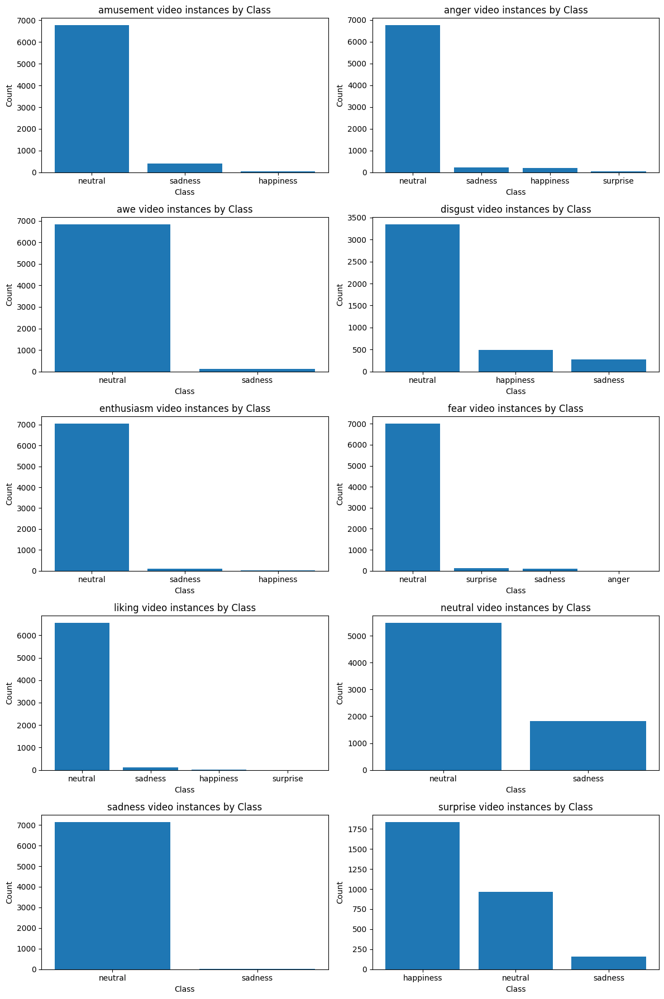

In [17]:
clips_array = ['amusement', 'anger', 'awe', 'disgust', 'enthusiasm', 'fear', 'liking', 'neutral', 'sadness', 'surprise']

# Define the number of rows and columns for subplots
num_rows = 5
num_cols = 2

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 18))

# Flatten the axs array to access individual subplots
axs = axs.flatten()

# Iterate over the clips_array and plot bar plots
for i, class_name in enumerate(clips_array):
    # Get the class counts for the current class
    class_counts = dataframes[class_name]['class'].value_counts()

    # Get the class labels and their respective counts
    class_labels = class_counts.index.tolist()
    counts = class_counts.values.tolist()

    # Create the bar plot on the current subplot
    axs[i].bar(class_labels, counts)

    axs[i].set_xlabel('Class')
    axs[i].set_ylabel('Count')
    axs[i].set_title(f'{class_name} video instances by Class')

# Remove any empty subplots
if len(clips_array) < num_rows * num_cols:
    for j in range(len(clips_array), num_rows * num_cols):
        fig.delaxes(axs[j])

# Adjust the spacing between subplots
fig.tight_layout()

plt.show()

In [18]:
clips_array = ['amusement', 'anger', 'awe', 'disgust', 'enthusiasm', 'fear', 'liking', 'neutral', 'sadness', 'surprise']

# Create an empty final dataframe
anger_final_df = pd.DataFrame()
disgust_final_df = pd.DataFrame()
sadness_final_df = pd.DataFrame()
neutral_final_df = pd.DataFrame()
surprise_final_df = pd.DataFrame()
happiness_final_df = pd.DataFrame()

# Loop through the dataframes
for clips in clips_array:
    # Append the current dataframe to the final dataframe
    anger_final_df = pd.concat([anger_final_df, anger_df[clips]], ignore_index=True)
    disgust_final_df = pd.concat([disgust_final_df, disgust_df[clips]], ignore_index=True)
    sadness_final_df = pd.concat([sadness_final_df, sadness_df[clips]], ignore_index=True)
    neutral_final_df = pd.concat([neutral_final_df, neutral_df[clips]], ignore_index=True)
    surprise_final_df = pd.concat([surprise_final_df, surprise_df[clips]], ignore_index=True)
    happiness_final_df = pd.concat([happiness_final_df, happiness_df[clips]], ignore_index=True)

In [19]:
happiness_final_df.sample(10)

,frame,face_id,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,...,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c,class,class_int
2134,2492,0,41.517,0.98,1,-0.019535,0.232754,-0.972340,-0.111911,0.255291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
973,1331,0,22.167,0.98,1,0.074491,0.201496,-0.976653,-0.116426,0.200462,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
1794,2152,0,35.850,0.98,1,0.072525,0.218624,-0.973110,-0.034618,0.206783,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
156,3690,0,61.483,0.98,1,0.130844,0.288898,-0.948376,-0.040958,0.288705,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,happiness,5
659,3962,0,66.017,0.98,1,-0.091360,0.259237,-0.961483,-0.144054,0.262868,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,happiness,5
1019,1377,0,22.933,0.98,1,0.028168,0.213005,-0.976645,-0.076615,0.239042,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5
569,3269,0,54.467,0.98,1,-0.013807,0.352869,-0.935571,-0.130702,0.346659,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,happiness,5
2273,2631,0,43.833,0.98,1,-0.014176,0.238238,-0.971103,-0.076909,0.243029,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
1298,1656,0,27.583,0.98,1,-0.021961,0.234197,-0.971941,-0.098602,0.221511,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
277,2844,0,47.383,0.98,1,-0.264902,0.225043,-0.937647,-0.463877,0.198277,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5


In [20]:
print(happiness_final_df.shape)

(2600, 716)


In [21]:
print(f"In the final dataframe, the number of records for \033[31m anger \033[0m will be: {anger_final_df.shape[0]}")
print(f"In the final dataframe, the number of records for \033[31m disgust \033[0m will be: {disgust_final_df.shape[0]}")
print(f"In the final dataframe, the number of records for \033[31m sadness \033[0m will be: {sadness_final_df.shape[0]}")
print(f"In the final dataframe, the number of records for \033[31m neutral \033[0m will be: {neutral_final_df.shape[0]}")
print(f"In the final dataframe, the number of records for \033[31m surprise \033[0m will be: {surprise_final_df.shape[0]}")
print(f"In the final dataframe, the number of records for \033[31m happiness \033[0m will be: {happiness_final_df.shape[0]}")

In the final dataframe, the number of records for  anger  will be: 3
In the final dataframe, the number of records for  disgust  will be: 0
In the final dataframe, the number of records for  sadness  will be: 3329
In the final dataframe, the number of records for  neutral  will be: 57809
In the final dataframe, the number of records for  surprise  will be: 154
In the final dataframe, the number of records for  happiness  will be: 2600


In [22]:
# Create a list of the dataframes
dfs = [anger_final_df, disgust_final_df, sadness_final_df, neutral_final_df, surprise_final_df, happiness_final_df]

# Concatenate the dataframes
concatenated_df = pd.concat(dfs)

# Reset the index of the concatenated dataframe
concatenated_df.reset_index(drop=True, inplace=True)

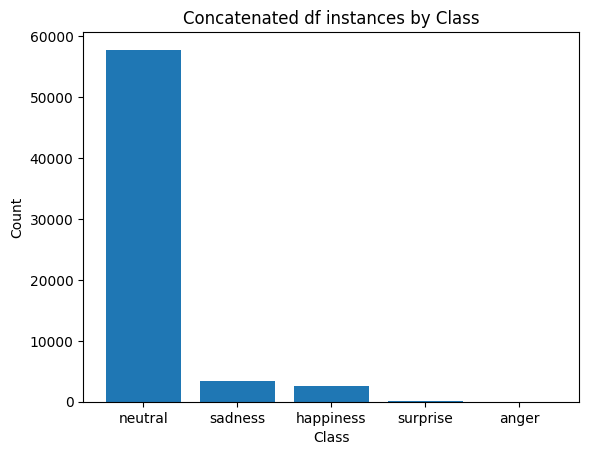

In [23]:
class_counts = concatenated_df['class'].value_counts()

# Get the class labels and their respective counts
class_labels = class_counts.index.tolist()
counts = class_counts.values.tolist()

# Create the bar plot
plt.bar(class_labels, counts)

plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Concatenated df instances by Class')

plt.show()

In [24]:
# Create a list of the dataframes with a smaller portion of neutral records
n_dfs = [sadness_final_df.sample(n=1600), neutral_final_df.sample(n=1600), happiness_final_df.sample(n=1600)]

# Concatenated normalized dataframes
n_concatenated_df = pd.concat(n_dfs)

# Reset the index of the concatenated dataframe
n_concatenated_df.reset_index(drop=True, inplace=True)

# Shuffle the rows of the DataFrame
shuffled_df = n_concatenated_df

In [25]:
# Print the updated DataFrame
print(f"The number of rows: {len(shuffled_df)}")
print("-----------------")
shuffled_df.sample(10)

The number of rows: 4800
-----------------


,frame,face_id,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,...,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c,class,class_int
3271,2116,0,35.250,0.98,1,-0.006681,0.244074,-0.969734,-0.089336,0.271794,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
2128,3265,0,54.400,0.98,1,0.088577,0.278956,-0.956210,-0.053379,0.317519,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,neutral,3
434,2625,0,43.733,0.98,1,-0.066010,0.303966,-0.950393,-0.172336,0.288734,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,sadness,2
2194,888,0,14.783,0.98,1,-0.006299,0.245958,-0.969260,-0.085543,0.269092,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,neutral,3
765,1947,0,32.433,0.98,1,0.000094,0.249386,-0.968404,-0.194853,0.220260,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,sadness,2
3587,3691,0,61.500,0.98,1,0.124007,0.287035,-0.949859,-0.044836,0.280256,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,happiness,5
1622,2817,0,46.933,0.98,1,0.009363,0.226157,-0.974046,-0.048479,0.238033,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,neutral,3
3456,2191,0,36.500,0.98,1,-0.019040,0.249271,-0.968247,-0.103553,0.258358,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
1006,3144,0,52.383,0.98,1,-0.060969,0.345316,-0.936504,-0.158219,0.343342,...,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,sadness,2
35,5793,0,96.533,0.98,1,-0.044042,0.237833,-0.970307,-0.134941,0.225651,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,sadness,2


<font color='blue' size='4'>In this particular section, I decided to reduce the number of features to only include those that were clearly and noticeably impactful to me (based on prior knowledge but we should definitely try different feature selection techniques to make sure we won't lose any useful infromation). Considering the large number of attributes (columns) present in the original CSV files, I believed that this approach would not only simplify the dataset but also potentially enhance the training process given the available resources.</font>

In [26]:
index = shuffled_df.columns.get_loc('AU01_r')
print(index)

679


In [27]:
# Define the column ranges
column_ranges = [
    (5, 298),
    (index, 715)
]

# Extract the desired columns
selected_columns = []
for start, end in column_ranges:
    selected_columns.extend(shuffled_df.iloc[:, start:end+1].columns)

# Create a new dataframe with the selected columns
new_df = shuffled_df[selected_columns]

new_df.sample(10)

,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,eye_lmk_x_0,eye_lmk_x_1,...,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c,class,class_int
3138,0.007435,0.271731,-0.962345,-0.064080,0.240858,-0.968443,-0.029,0.259,413.4,414.8,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,neutral,3
3706,-0.030339,0.247572,-0.968394,-0.092038,0.262488,-0.960536,-0.063,0.259,392.6,394.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
2238,0.142260,0.284274,-0.948130,-0.067690,0.294633,-0.953210,0.039,0.296,389.6,392.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,neutral,3
4249,0.093004,0.246753,-0.964605,-0.057698,0.256581,-0.964799,0.018,0.255,485.8,488.8,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,happiness,5
3187,-0.017233,0.241944,-0.970137,-0.097956,0.261604,-0.960192,-0.060,0.255,409.2,410.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neutral,3
3967,0.097388,0.294892,-0.950555,-0.166463,0.333455,-0.927953,-0.037,0.323,516.0,519.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5
2661,-0.015909,0.234194,-0.972060,-0.080830,0.213928,-0.973499,-0.050,0.226,407.5,408.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neutral,3
1128,0.027278,0.342068,-0.939279,-0.199491,0.385111,-0.901051,-0.093,0.376,406.7,408.5,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,sadness,2
4444,0.077570,0.179515,-0.980692,-0.097876,0.184971,-0.977858,-0.010,0.184,408.1,411.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
4400,0.100895,0.293293,-0.950684,-0.018087,0.274530,-0.961409,0.043,0.289,385.2,387.5,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,happiness,5


<font color='blue' size='4'>In this subsequent section, I decided to further reduce the dimensionality of the dataset by employing feature aggregation (calculating the mean) for those specific features that exhibited significant relevance to only a single category and make a final dataframe for standarization and normalization. Other techniques can be used as well</font>

In [28]:
subsets = [
    ['gaze_0_x', 'gaze_1_x'],
    ['gaze_0_y', 'gaze_1_y'],
    ['gaze_0_z', 'gaze_1_z'],
    ['eye_lmk_x_' + str(i) for i in range(56)],
    ['eye_lmk_y_' + str(i) for i in range(56)],
    ['eye_lmk_X_' + str(i) for i in range(56)],
    ['eye_lmk_Y_' + str(i) for i in range(56)],
    ['eye_lmk_Z_' + str(i) for i in range(56)]
]

# Create a new dataframe to store the aggregated features
aggregated_df = pd.DataFrame()

# Define custom column names for the mean columns
mean_column_names = ['gaze_x', 'gaze_y', 'gaze_z', 'eye_lmk_x', 'eye_lmk_y', 'eye_lmk_X', 'eye_lmk_Y', 'eye_lmk_Z']

# Perform mean aggregation for each subset
for subset, column_name in zip(subsets, mean_column_names):
    subset_mean = new_df[subset].mean(axis=1)  # Calculate the mean along the row axis
    aggregated_df[column_name] = subset_mean

# Drop the original features used for aggregation
new_df = new_df.drop(columns=[col for subset in subsets for col in subset])

# Concatenate the aggregated features with the unchanged features
final_df = pd.concat([aggregated_df, new_df], axis=1)

final_df.sample(10)

,gaze_x,gaze_y,gaze_z,eye_lmk_x,eye_lmk_y,eye_lmk_X,eye_lmk_Y,eye_lmk_Z,gaze_angle_x,gaze_angle_y,...,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c,class,class_int
4389,-0.055915,0.357006,-0.921539,564.798214,949.132143,12.998214,-5.507143,722.689286,-0.061,0.370,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,happiness,5
1252,-0.069853,0.233948,-0.968885,473.941071,938.771429,-36.835714,-11.383929,768.114286,-0.072,0.237,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,sadness,2
1831,-0.108132,0.227390,-0.966645,486.771429,923.014286,-29.953571,-20.189286,775.251786,-0.111,0.231,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neutral,3
1881,-0.064853,0.212811,-0.973348,487.989286,924.264286,-28.073214,-18.383929,741.408929,-0.067,0.215,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neutral,3
4629,0.087231,0.283475,-0.950849,445.951786,908.350000,-45.510714,-25.189286,692.201786,0.091,0.290,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
4212,0.093379,0.353764,-0.927401,465.364286,908.151786,-39.691071,-26.214286,727.873214,0.100,0.364,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,happiness,5
3870,-0.067841,0.239388,-0.967565,460.939286,939.894643,-41.548214,-10.171429,727.041071,-0.070,0.243,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,happiness,5
1847,-0.085799,0.240548,-0.966167,475.116071,934.230357,-36.001786,-13.883929,771.553571,-0.089,0.244,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neutral,3
2940,-0.099397,0.219669,-0.969992,490.312500,922.853571,-28.492857,-20.457143,781.807143,-0.102,0.223,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neutral,3
848,-0.092877,0.232994,-0.967063,474.587500,938.432143,-35.773214,-11.412500,757.141071,-0.096,0.236,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,sadness,2


In [29]:
final_df.columns

Index(['gaze_x', 'gaze_y', 'gaze_z', 'eye_lmk_x', 'eye_lmk_y', 'eye_lmk_X',
       'eye_lmk_Y', 'eye_lmk_Z', 'gaze_angle_x', 'gaze_angle_y', 'pose_Tx',
       'pose_Ty', 'pose_Tz', 'pose_Rx', 'pose_Ry', 'pose_Rz', 'AU01_r',
       'AU02_r', 'AU04_r', 'AU05_r', 'AU06_r', 'AU07_r', 'AU09_r', 'AU10_r',
       'AU12_r', 'AU14_r', 'AU15_r', 'AU17_r', 'AU20_r', 'AU23_r', 'AU25_r',
       'AU26_r', 'AU45_r', 'AU01_c', 'AU02_c', 'AU04_c', 'AU05_c', 'AU06_c',
       'AU07_c', 'AU09_c', 'AU10_c', 'AU12_c', 'AU14_c', 'AU15_c', 'AU17_c',
       'AU20_c', 'AU23_c', 'AU25_c', 'AU26_c', 'AU28_c', 'AU45_c', 'class',
       'class_int'],
      dtype='object')

In [30]:
features = ['gaze_x', 'gaze_y', 'gaze_z', 'eye_lmk_x', 'eye_lmk_y', 'eye_lmk_X',
       'eye_lmk_Y', 'eye_lmk_Z', 'gaze_angle_x', 'gaze_angle_y', 'pose_Tx',
       'pose_Ty', 'pose_Tz', 'pose_Rx', 'pose_Ry', 'pose_Rz', 'AU01_r',
       'AU02_r', 'AU04_r', 'AU05_r', 'AU06_r', 'AU07_r', 'AU09_r', 'AU10_r',
       'AU12_r', 'AU14_r', 'AU15_r', 'AU17_r', 'AU20_r', 'AU23_r', 'AU25_r',
       'AU26_r', 'AU45_r', 'AU01_c', 'AU02_c', 'AU04_c', 'AU05_c', 'AU06_c',
       'AU07_c', 'AU09_c', 'AU10_c', 'AU12_c', 'AU14_c', 'AU15_c', 'AU17_c',
       'AU20_c', 'AU23_c', 'AU25_c', 'AU26_c', 'AU28_c', 'AU45_c']

## Z-Score

In [31]:
# Z-Score using pandas
for fe in features:
    final_df['{}_Z'.format(fe)] = (final_df[fe] - final_df[fe].mean()) / final_df[fe].std()

In [32]:
features_Z = [fe + '_Z' for fe in features]

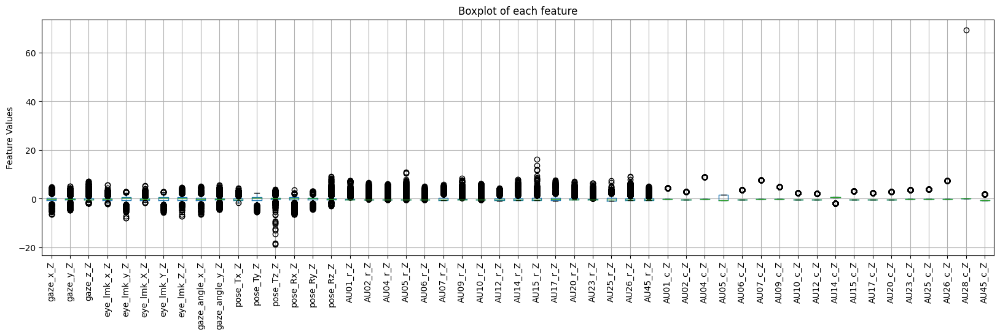

In [33]:
plt.figure(figsize=(20, 5))
final_df[features_Z].boxplot()
plt.xticks(rotation=90)
plt.title('Boxplot of each feature')
plt.ylabel('Feature Values')
plt.show()

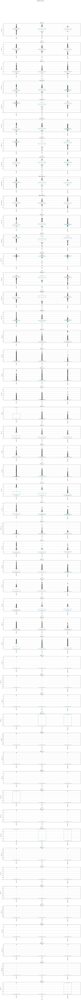

In [34]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(features_Z), 1, figsize=(17, len(features_Z) * 4))

for i, ax in enumerate(axes):
    final_df.boxplot(column=features_Z[i], by='class', ax=ax)
    ax.set_ylabel(features_Z[i])
    ax.set_xlabel('class')
    ax.set_xticklabels(final_df['class'].unique(), rotation='vertical')

plt.suptitle('Boxplots by Class', y=1.02)
plt.tight_layout()
plt.show()

In [35]:
len(features_Z)

51

In [36]:
final_df['class_int'].unique()

array([2, 3, 5])

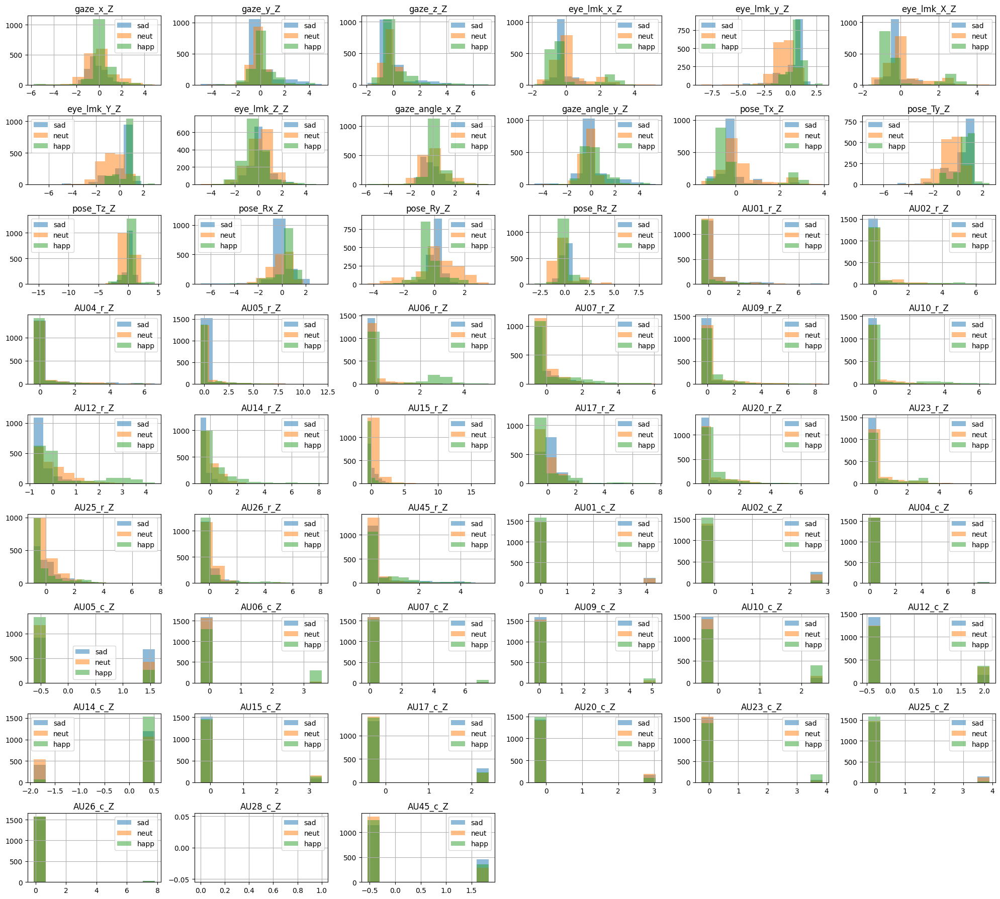

In [37]:
fig = plt.figure(figsize = (20,18))
for nr, fe in enumerate(features_Z):
    plt.subplot(9, 6, nr + 1)
    final_df[final_df.class_int == 2][fe].hist(alpha=0.5, label='sad')
    final_df[final_df.class_int == 3][fe].hist(alpha=0.5, label='neut')
    final_df[final_df.class_int == 5][fe].hist(alpha=0.5, label='happ')
    plt.title(fe)
    plt.legend()
plt.tight_layout()

### Plot Pairplot (each feature against each feature and also the label against each feature)

In [37]:
features_mix = list(itertools.product(features_Z + ['class'], features_Z + ['class']))
fra = int(np.sqrt(len(features_mix)))
plt.figure(figsize=(fra*2, fra*2))

i = 0
for fe1, fe2 in features_mix:
    i += 1
    plt.subplot(fra, fra, i)
    if fe1 == fe2:
        plt.plot(final_df[fe1], final_df[fe2], '.')
    else:
        plt.plot(final_df[fe1], final_df[fe2], 'o')
    if i % fra == 1:
        plt.ylabel(fe1)
    if i in range((fra-1) * fra + 1, (fra * fra) + 1):
        plt.xlabel(fe2)
    plt.xticks([])
    plt.yticks([])


In [65]:
features_mix = list(itertools.product(features_Z + ['class'], features_Z + ['class']))
fra = int(np.sqrt(len(features_mix)))
plt.figure(figsize = (fra*2, fra*2))

i = 0
for fe1, fe2 in features_mix:
    i += 1
    plt.subplot(fra, fra, i)
    if fe1 == fe2:
        plt.hist(final_df[fe1])
    else:
        plt.plot(final_df[fe1], final_df[fe2], '.')
    if i%fra == 1:
        plt.ylabel(fe1)
    if i in range((fra-1)*fra+1, (fra*fra)+1):
        plt.xlabel(fe2)
    plt.xticks([])
    plt.yticks([])

# PCA

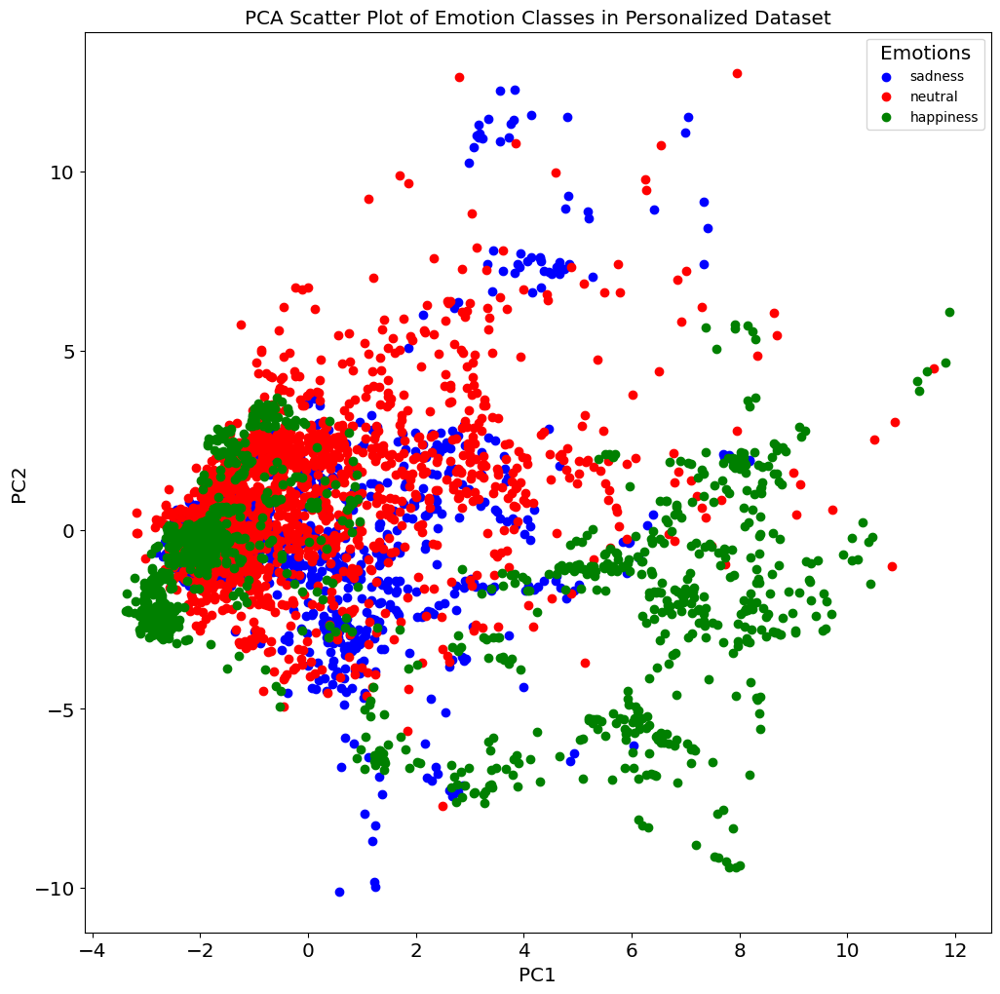

In [38]:
# plt.figure(figsize=(12, 12))
# em_pca = PCA(n_components=2)
# pca_x = em_pca.fit_transform(final_df[features_Z].values)

# em_cat = list(final_df['class'].unique())
# color_map = {label: i for i, label in enumerate(em_cat)}
# colors = [color_map[label] for label in final_df['class']]

# plt_scat = plt.scatter(pca_x[:, 0], pca_x[:, 1], c=colors)

# plt.legend(handles=plt_scat.legend_elements()[0], labels=em_cat, title="Emotions")
# plt.xlabel('PCA 1')
# plt.ylabel('PCA 2')
# plt.show()

plt.figure(figsize=(12, 12))

# Perform PCA on the feature data
em_pca = PCA(n_components=2)
pca_x = em_pca.fit_transform(final_df[features_Z].values)

# Get unique class labels
em_cat = list(final_df['class'].unique())

# Define custom colormap for the classes
colors = ['blue', 'red', 'green']

# Plot the scatter plot with custom colors
for i, label in enumerate(em_cat):
    class_indices = final_df['class'] == label
    plt.scatter(pca_x[class_indices, 0], pca_x[class_indices, 1], c=colors[i], label=label)

legend = plt.legend(title="Emotions")
legend.get_title().set_fontsize('x-large')  # Increase legend title font size
plt.xlabel('PC1', fontsize='x-large')
plt.ylabel('PC2', fontsize='x-large')
plt.tick_params(labelsize='x-large')  # Increase tick labels font size
plt.title('PCA Scatter Plot of Emotion Classes in Personalized Dataset', fontsize='x-large')  # Adding the title
plt.show()

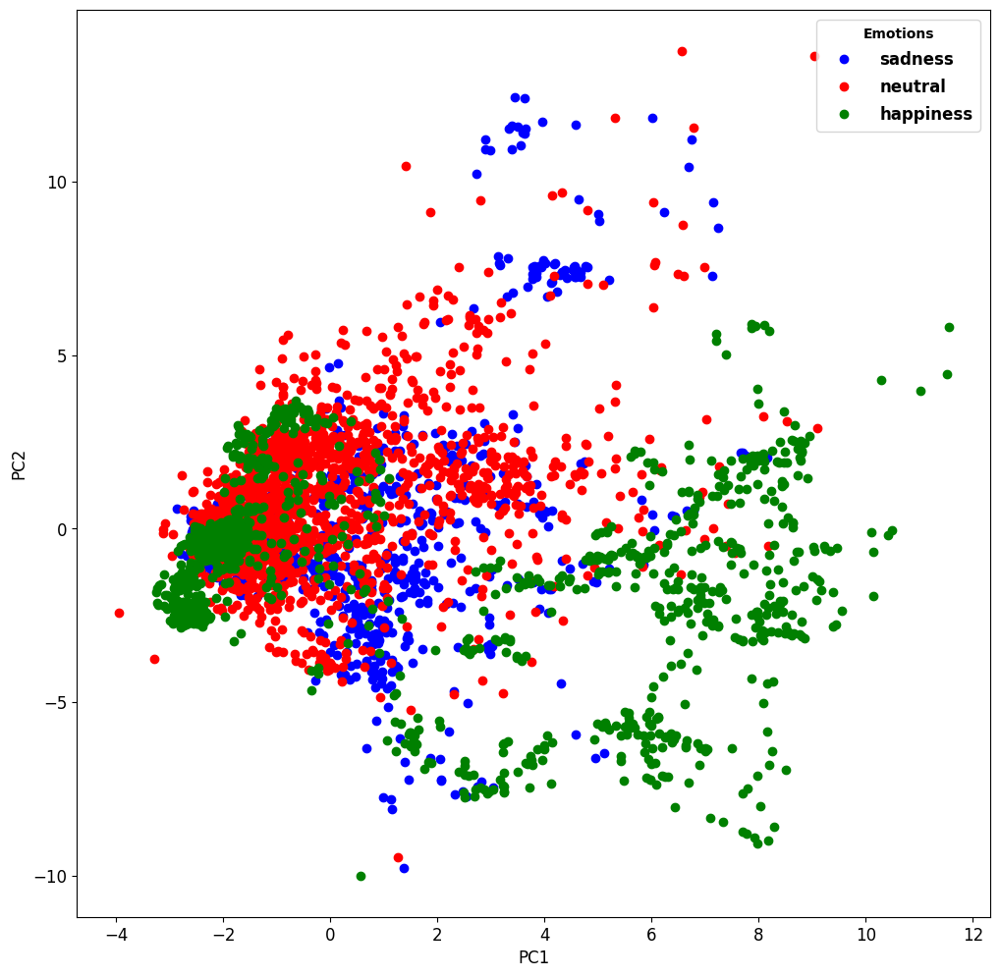

In [61]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

plt.figure(figsize=(12, 12))

# Perform PCA on the feature data
em_pca = PCA(n_components=2)
pca_x = em_pca.fit_transform(final_df[features_Z].values)

# Get unique class labels
em_cat = list(final_df['class'].unique())

# Define custom colormap for the classes
colors = ['blue', 'red', 'green']

# Initialize an empty list to hold scatter plot handles
scatter_handles = []

# Plot the scatter plot with custom colors and store handles
for i, label in enumerate(em_cat):
    class_indices = final_df['class'] == label
    handle = plt.scatter(pca_x[class_indices, 0], pca_x[class_indices, 1], c=colors[i], label=label)
    scatter_handles.append(handle)

# Get the legend object and set its font size and title
legend = plt.legend(handles=scatter_handles, title="Emotions", fontsize='x-large')
legend.get_title().set_fontweight('bold')  # Make legend title bold

# Get the legend labels and set their font size and weight (bold)
for text in legend.get_texts():
    text.set_fontsize('large')  # Increase legend labels font size
    text.set_fontweight('bold')   # Make legend labels bold

plt.xlabel('PC1', fontsize='large')  # Increase x-axis label font size
plt.ylabel('PC2', fontsize='large')  # Increase y-axis label font size
plt.tick_params(labelsize='large')  # Increase tick labels font size
plt.show()


In [39]:
em_pca = PCA(n_components=40)
em_pca.fit(final_df[features_Z].values)
evro = em_pca.explained_variance_ratio_
for i in range(2,45):
    print('\033[92m', np.round(sum(evro[:i])*100, 2), '\033[0m% of the variance is covered by', 'axes 1-{}'.format(i))

 27.39 % of the variance is covered by axes 1-2
 35.71 % of the variance is covered by axes 1-3
 43.14 % of the variance is covered by axes 1-4
 49.41 % of the variance is covered by axes 1-5
 54.58 % of the variance is covered by axes 1-6
 58.23 % of the variance is covered by axes 1-7
 61.42 % of the variance is covered by axes 1-8
 64.37 % of the variance is covered by axes 1-9
 66.91 % of the variance is covered by axes 1-10
 69.19 % of the variance is covered by axes 1-11
 71.36 % of the variance is covered by axes 1-12
 73.34 % of the variance is covered by axes 1-13
 75.28 % of the variance is covered by axes 1-14
 77.18 % of the variance is covered by axes 1-15
 78.96 % of the variance is covered by axes 1-16
 80.61 % of the variance is covered by axes 1-17
 82.17 % of the variance is covered by axes 1-18
 83.68 % of the variance is covered by axes 1-19
 85.05 % of the variance is covered by axes 1-20
 86.38 % of the variance is covered by axes 1-21
 87.64 % of the variance is 

<font color='blue' size='4'>40 components are needed to cover 99% of the variance!</font>

# Model Selection

## KNN

In [40]:
y = final_df['class'].values
X = final_df[features_Z].values

### F1 score

In [69]:
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score

k_selection = range(1, 30)
cons = RepeatedKFold(n_splits=5, n_repeats=3, random_state=50)
em_knn = KNeighborsClassifier()

# Lists to store F1 scores for each k value
f1_scores = []

for k in k_selection:
    em_knn.set_params(n_neighbors=k)
    f1_scores.append(np.mean(cross_val_score(em_knn, X, y, cv=cons, scoring='f1_weighted')))

best_k = k_selection[np.argmax(f1_scores)]

Text(0, 0.5, 'F1 Score')

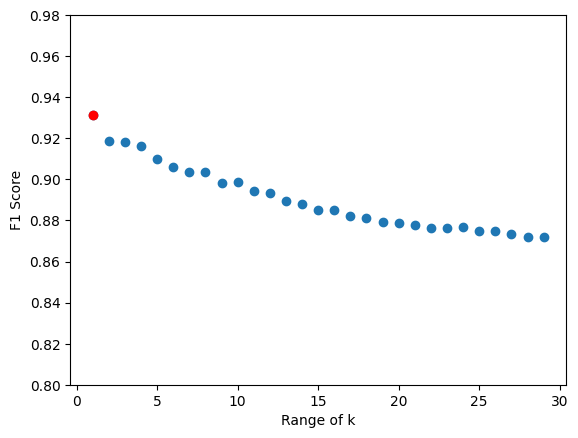

In [70]:
plt.plot(k_selection, f1_scores, 'o')
plt.plot(best_k, np.max(f1_scores), 'ro')
plt.ylim((0.8, 0.98))
plt.xlabel('Range of k')
plt.ylabel('F1 Score')

### Accuracy

In [41]:
k_selection=range(1,30) #6
cons = RepeatedKFold(n_splits=5, n_repeats=3, random_state=50)
# knn
em_knn = KNeighborsClassifier()
pms={'n_neighbors': k_selection}
em_gs = GridSearchCV(em_knn, pms, cv=cons, return_train_score=False)
em_gs.fit(X,y)
em_gs.best_params_['n_neighbors']

1

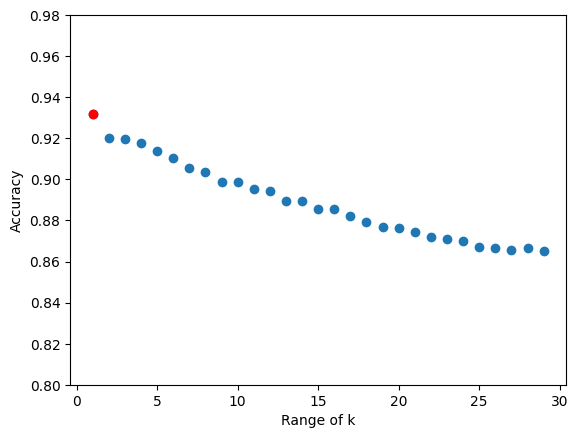

In [42]:
plt.plot(k_selection, em_gs.cv_results_['mean_test_score'],'o')
# highlight the best parameter
plt.plot(em_gs.best_params_['n_neighbors'], np.max(em_gs.cv_results_['mean_test_score']),'ro')
plt.plot()
plt.ylim((0.8,0.98))
plt.xlabel('Range of k')
plt.ylabel('Accuracy');

## Random Forest

In [43]:
y = final_df['class'].values
X = final_df[features_Z].values

In [44]:
rf_clfr = RandomForestClassifier(random_state=20)
cons = RepeatedKFold(n_splits=5, n_repeats=3, random_state=5)

max_depths = [5, 10, 15, 20, None]
max_features = ['sqrt', 'log2', 0.25, 0.5, 0.75, None]
parameters={'max_depth': max_depths,
           'max_features': max_features}

em_gs = GridSearchCV(rf_clfr, parameters, cv=cons, return_train_score=False, n_jobs=-1)
em_gs.fit(X,y)

print('Best hyperparameter combination:')
print('Max Depth:', em_gs.best_params_['max_depth'])
print('Max Feature:', em_gs.best_params_['max_features'])

Best hyperparameter combination:
Max Depth: None
Max Feature: log2


In [45]:
comb_params = list(itertools.product(max_depths, max_features))

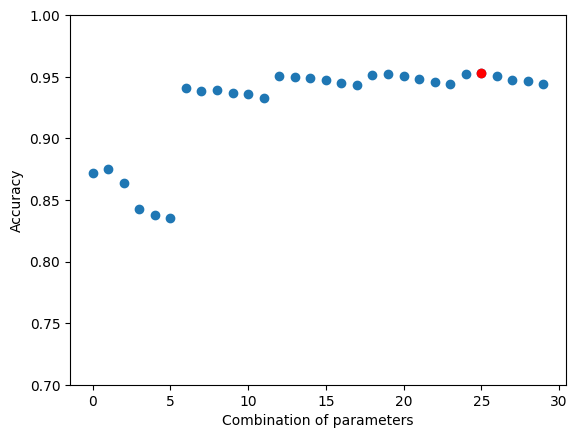

In [46]:
plt.plot(em_gs.cv_results_['mean_test_score'],'o')

ind = np.where((np.array(comb_params)[:,0] == em_gs.best_params_['max_depth']) &
(np.array(comb_params)[:,1] == em_gs.best_params_['max_features']))[0][0]

plt.plot(ind, np.max(em_gs.cv_results_['mean_test_score']),'ro')
plt.plot()
plt.ylim((0.7,1))
plt.xlabel('Combination of parameters')
plt.ylabel('Accuracy');

Text(0.5, 1.0, 'Features Importance')

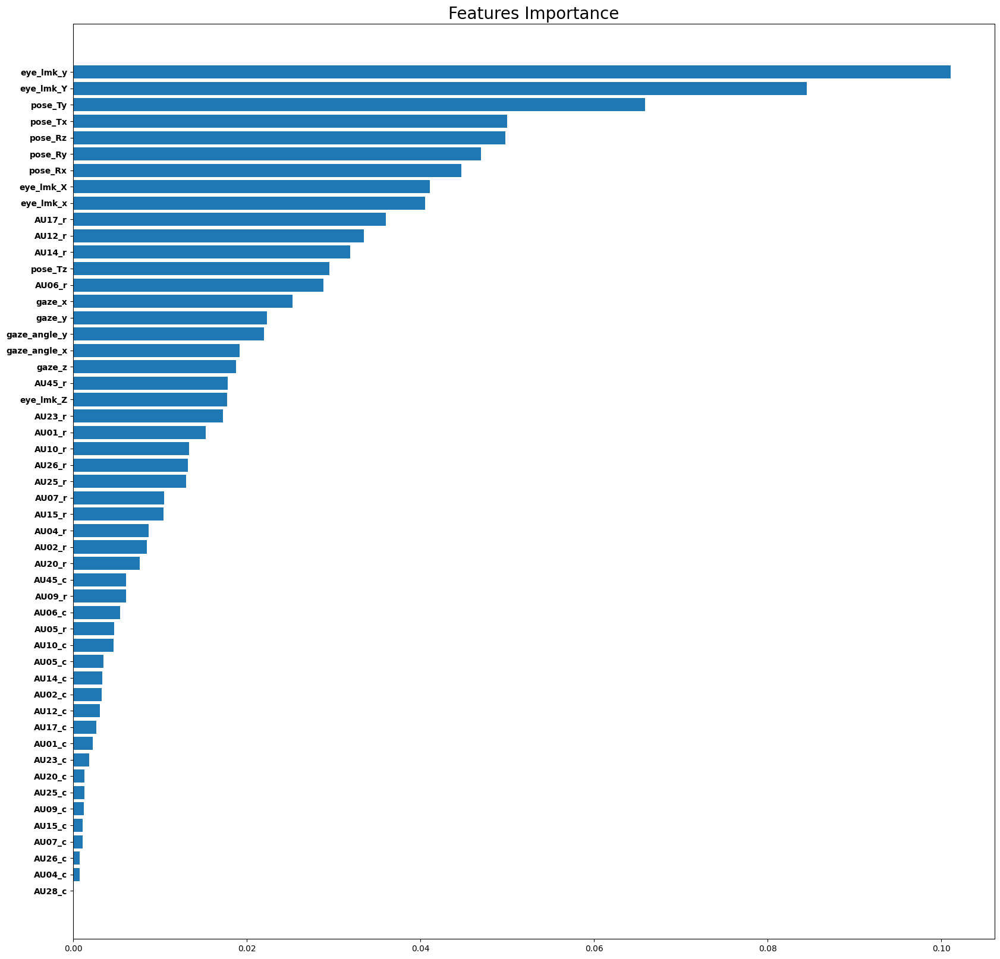

In [50]:
# Feature importance plot
y_feats = np.arange(len(features))
fig, ax = plt.subplots(figsize=(20, 20))
ind = np.argsort(em_gs.best_estimator_.feature_importances_)

ax.barh(y_feats, np.flip(em_gs.best_estimator_.feature_importances_[ind]), align='center')
ax.set_yticks(y_feats)
ax.set_yticklabels(np.flip(np.array(features)[ind]), fontweight='bold')
ax.invert_yaxis()  # To read the features from top-to-bottom
ax.set_title('Features Importance', fontsize=20)

### F1 score

In [74]:
rf_clfr = RandomForestClassifier(random_state=20)
cons = RepeatedKFold(n_splits=5, n_repeats=3, random_state=5)

max_depths = [5, 10, 15, 20, None]
max_features = ['sqrt', 'log2', 0.25, 0.5, 0.75, None]
parameters = {'max_depth': max_depths,
              'max_features': max_features}

em_gs = GridSearchCV(rf_clfr, parameters, cv=cons, return_train_score=False, n_jobs=-1)
em_gs.fit(X, y)

print('Best hyperparameter combination:')
print('Max Depth:', em_gs.best_params_['max_depth'])
print('Max Feature:', em_gs.best_params_['max_features'])

Best hyperparameter combination:
Max Depth: None
Max Feature: sqrt


In [75]:
comb_params = list(itertools.product(max_depths, max_features))

Text(0, 0.5, 'F1 Score')

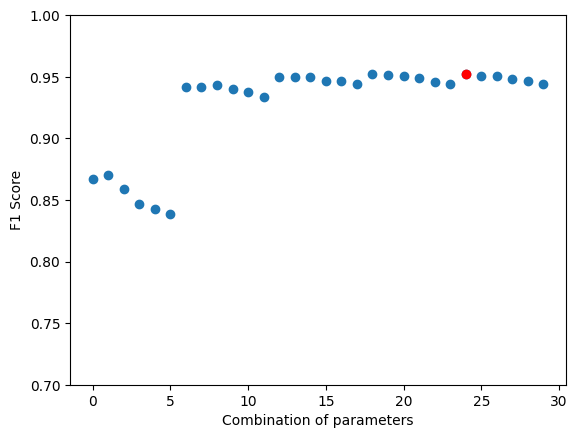

In [76]:
# Lists to store F1 scores for each combination of parameters
f1_scores = []

for params in comb_params:
    rf_clfr.set_params(max_depth=params[0], max_features=params[1])
    f1_scores.append(np.mean(cross_val_score(rf_clfr, X, y, cv=cons, scoring='f1_weighted')))

best_params = comb_params[np.argmax(f1_scores)]

plt.plot(f1_scores, 'o')

ind = comb_params.index(best_params)
plt.plot(ind, np.max(f1_scores), 'ro')
plt.ylim((0.7, 1))
plt.xlabel('Combination of parameters')
plt.ylabel('F1 Score')

## MLP

In [63]:
y = final_df['class'].values
X = final_df[features_Z].values

In [64]:
mlp_clfr = MLPClassifier(max_iter=10000, early_stopping=True, random_state=20)

hid_layers_s = [(i,) for i in range(3,8)]
val_frac = [0.1, 0.5]
opt_select = ['adam', 'sgd']
activ_f = ['relu', 'logistic']

parameter_space = {
    'hidden_layer_sizes': hid_layers_s,
    'activation': activ_f,
    'solver': opt_select,
    'validation_fraction': val_frac
}

cons = RepeatedKFold(n_splits=5, n_repeats=3, random_state=5)

# search and select the best hyperparameter combs
em_gs = GridSearchCV(mlp_clfr, parameter_space, cv=cons)
em_gs.fit(X, y)
print('Combination of best hyperparameters:')
em_gs.best_params_

Combination of best hyperparameters:


{'activation': 'relu',
 'hidden_layer_sizes': (7,),
 'solver': 'adam',
 'validation_fraction': 0.1}

In [65]:
comb_params = list(itertools.product(activ_f, hid_layers_s, opt_select, val_frac))

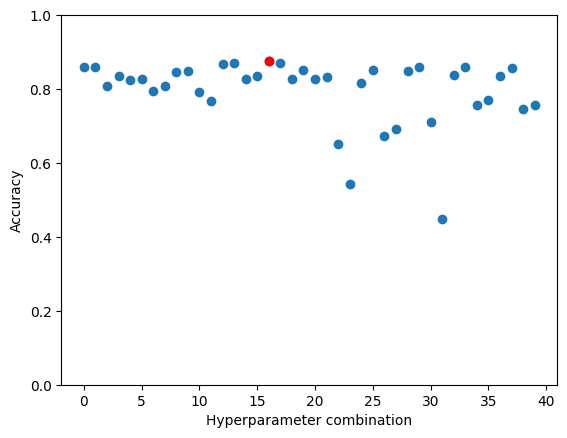

In [66]:
plt.plot(em_gs.cv_results_['mean_test_score'],'o')
# best feature combination
ind = comb_params.index(tuple(em_gs.best_params_.values()))
plt.plot(ind, np.max(em_gs.cv_results_['mean_test_score']),'ro')
plt.plot()
plt.ylim((0,1))
plt.xlabel('Hyperparameter combination')
plt.ylabel('Accuracy');

# Performance Estimation

## KNN

In [51]:
y = final_df['class'].values
X = final_df[features_Z].values

In [52]:
start_time = time.time()

k_selection=range(1,30) 

kfold_outer = KFold(n_splits=10, random_state=10, shuffle=True)
kfold_inner = RepeatedKFold(n_splits=5, n_repeats=3, random_state=50)

# knn classifier
knn_clfr = KNeighborsClassifier()

parameters={'n_neighbors': k_selection}

y_preds_knn = []
y_trues_knn = []
best_hc_knn = []

for train_index, test_index in kfold_outer.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # search and select
    em_gs = GridSearchCV(knn_clfr, parameters, cv=kfold_inner, return_train_score=False)
    em_gs.fit(X_train, y_train)
    # ROAUC
    y_score=em_gs.fit(X_train, y_train).predict_proba(X_test)
    label_binarizer = LabelBinarizer().fit(y_train)
    y_onehot_test = label_binarizer.transform(y_test)
    
    # predict on the the test data useing the selected model
    y_preds_knn.extend(list(em_gs.predict(X_test)))
    y_trues_knn.extend(y_test)
    
    # save the best combination of hyperparameters
    best_hc_knn.append(em_gs.best_params_['n_neighbors'])
    
print("--- %s seconds ---" % (time.time() - start_time))

--- 1081.7289106845856 seconds ---


In [53]:
y_score

array([[0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       ...,
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.]])

In [54]:
label_binarizer.transform(["happiness"])

array([[1, 0, 0]])

In [55]:
class_of_interest = "happiness"
class_id = np.flatnonzero(label_binarizer.classes_ == class_of_interest)[0]
class_id

0

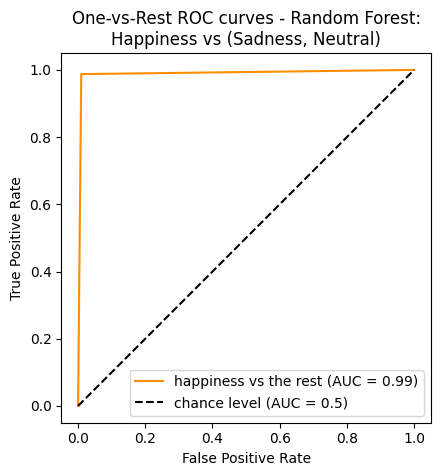

In [56]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_predictions(
    y_onehot_test[:, class_id],
    y_score[:, class_id],
    name=f"{class_of_interest} vs the rest",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("One-vs-Rest ROC curves - Random Forest:\nHappiness vs (Sadness, Neutral)")
plt.legend()
plt.show()

In [57]:
print(f"y_score:\n{y_score[0:2,:]}")
print()
print(f"y_score.ravel():\n{y_score[0:2,:].ravel()}")

y_score:
[[0. 0. 1.]
 [0. 0. 1.]]

y_score.ravel():
[0. 0. 1. 0. 0. 1.]


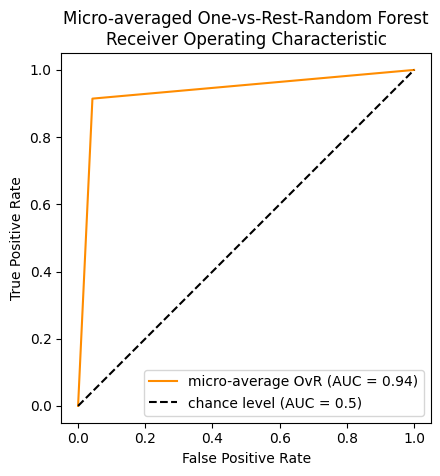

In [58]:
RocCurveDisplay.from_predictions(
    y_onehot_test.ravel(),
    y_score.ravel(),
    name="micro-average OvR",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest-Random Forest\nReceiver Operating Characteristic")
plt.legend()
plt.show()

In [59]:
from sklearn.metrics import roc_curve, auc

# store the fpr, tpr, and roc_auc for all averaging strategies
fpr, tpr, roc_auc = dict(), dict(), dict()
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
0.94


In [60]:
n_classes = len(np.unique(y))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_onehot_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['macro']:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
0.93


In [61]:
from sklearn.metrics import roc_auc_score
macro_roc_auc_ovr = roc_auc_score(
    y_test,
    y_score,
    multi_class="ovr",
    average="macro",
)

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{macro_roc_auc_ovr:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
0.93


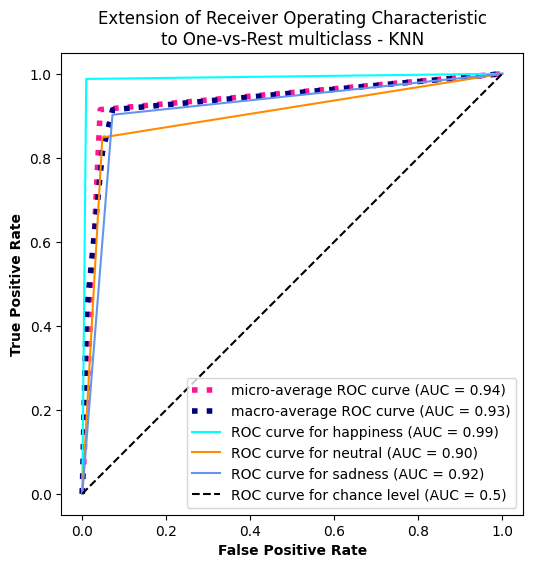

In [63]:
from itertools import cycle
target_names = ["happiness", "neutral", "sadness"]

fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

plt.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(n_classes), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test[:, class_id],
        y_score[:, class_id],
        name=f"ROC curve for {target_names[class_id]}",
        color=color,
        ax=ax,
    )

plt.plot([0, 1], [0, 1], "k--", label="ROC curve for chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate", fontweight='bold')
plt.ylabel("True Positive Rate", fontweight='bold')
plt.title("Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass - KNN")
plt.legend()
plt.show()

Predicted: Happiness Neutral Sadness
True: Happiness 1585 7 8
True: Neutral 25 1381 194
True: Sadness 7 80 1513


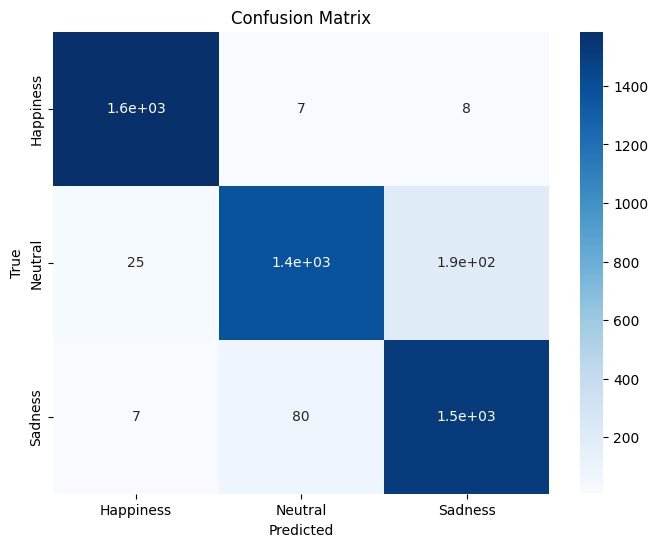

Accuracy: 0.933
best k counts:
1 : 10


In [64]:
# Calculate the confusion matrix
cm = metrics.confusion_matrix(y_trues_knn, y_preds_knn)

# Define the class labels
class_labels = ['Happiness', 'Neutral', 'Sadness']

# Print the predicted and true labels
print('Predicted:', *class_labels)
for i, row in enumerate(cm):
    print('True:', class_labels[i], *row)

# Calculate the accuracy
accuracy = np.round(metrics.accuracy_score(y_trues_knn, y_preds_knn), 3)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Print the accuracy
print('Accuracy:', accuracy)

print('best k counts:')
for best_k in np.unique(best_hc_knn):
    print(best_k, ':', best_hc_knn.count(best_k))

Confusion Matrix:
Predicted: Happiness Neutral Sadness
True: Happiness  1585     7     8
True: Neutral    25  1381   194
True: Sadness     7    80  1513


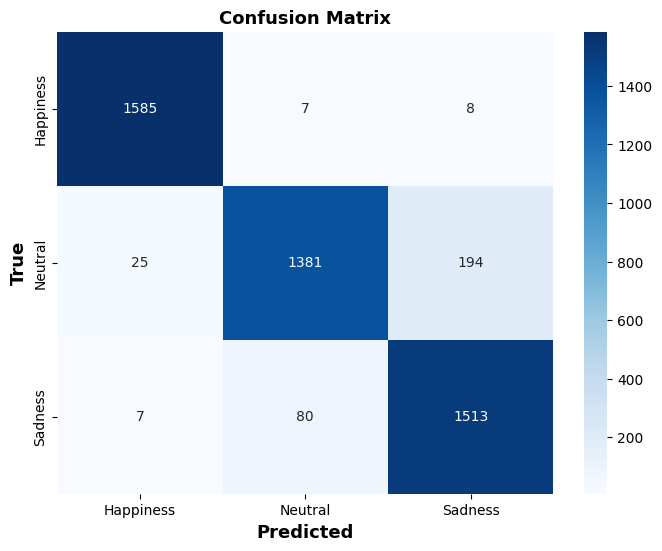

Accuracy: 0.933
best k counts:
1 : 10


In [82]:
# Calculate the confusion matrix
cm = metrics.confusion_matrix(y_trues_knn, y_preds_knn)

# Define the class labels
class_labels = ['Happiness', 'Neutral', 'Sadness']

# Print the confusion matrix with normal formatting
print('Confusion Matrix:')
print('Predicted:', *class_labels)
for i, row in enumerate(cm):
    print('True:', class_labels[i], *[f"{num:5d}" for num in row])

# Calculate the accuracy
accuracy = np.round(metrics.accuracy_score(y_trues_knn, y_preds_knn), 3)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix', fontweight='bold', fontsize=13)
plt.xlabel('Predicted', fontweight='bold', fontsize=13)
plt.ylabel('True', fontweight='bold', fontsize=13)
plt.show()

# Print the accuracy
print('Accuracy:', accuracy)

print('best k counts:')
for best_k in np.unique(best_hc_knn):
    print(best_k, ':', best_hc_knn.count(best_k))

## Random Forest

In [67]:
start_time = time.time()

kfold_outer = KFold(n_splits=10, random_state=10, shuffle=True)
kfold_inner = RepeatedKFold(n_splits=5, n_repeats=3, random_state=50)

max_depths = [20, None]
max_features = ['sqrt', 'log2']
parameters={'max_depth': max_depths,
           'max_features': max_features}

rf_clfr = RandomForestClassifier(random_state=20)

y_preds = []
y_trues = []
best_p = []

for train_index, test_index in kfold_outer.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # select the best model
    em_gs = GridSearchCV(rf_clfr, parameters, cv=kfold_inner, return_train_score=False)
    em_gs.fit(X_train, y_train)
    # ROAUC
    y_score_rf=em_gs.fit(X_train, y_train).predict_proba(X_test)
    label_binarizer_rf = LabelBinarizer().fit(y_train)
    y_onehot_test_rf = label_binarizer.transform(y_test)
    
    # use the selected model to predict the classes for the test data
    y_preds.extend(list(em_gs.predict(X_test)))
    y_trues.extend(y_test)
    
    # save the best hyperparameter combination
    best_p.append(em_gs.best_params_)
    
print("--- %s seconds ---" % (time.time() - start_time))

--- 710.1911141872406 seconds ---


In [68]:
y_score_rf

array([[0.05, 0.09, 0.86],
       [0.  , 0.04, 0.96],
       [0.  , 0.04, 0.96],
       ...,
       [0.98, 0.01, 0.01],
       [0.96, 0.03, 0.01],
       [0.95, 0.  , 0.05]])

In [69]:
label_binarizer_rf.transform(["happiness"])

array([[1, 0, 0]])

In [70]:
class_of_interest = "happiness"
class_id = np.flatnonzero(label_binarizer_rf.classes_ == class_of_interest)[0]
class_id

0

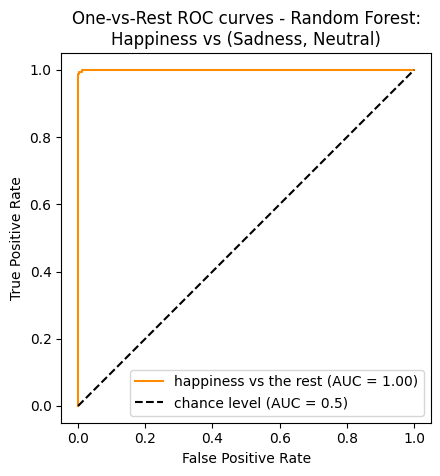

In [71]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_predictions(
    y_onehot_test_rf[:, class_id],
    y_score_rf[:, class_id],
    name=f"{class_of_interest} vs the rest",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("One-vs-Rest ROC curves - Random Forest:\nHappiness vs (Sadness, Neutral)")
plt.legend()
plt.show()

In [72]:
print(f"y_score:\n{y_score_rf[0:2,:]}")
print()
print(f"y_score.ravel():\n{y_score_rf[0:2,:].ravel()}")

y_score:
[[0.05 0.09 0.86]
 [0.   0.04 0.96]]

y_score.ravel():
[0.05 0.09 0.86 0.   0.04 0.96]


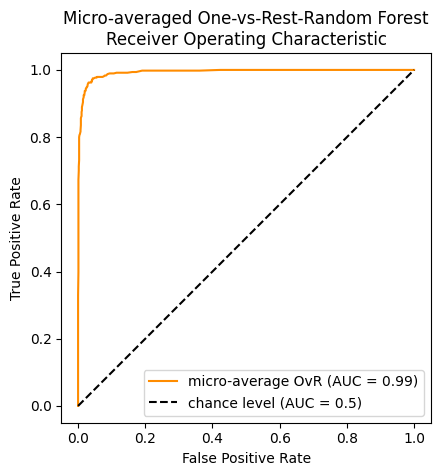

In [73]:
RocCurveDisplay.from_predictions(
    y_onehot_test_rf.ravel(),
    y_score_rf.ravel(),
    name="micro-average OvR",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest-Random Forest\nReceiver Operating Characteristic")
plt.legend()
plt.show()

In [74]:
from sklearn.metrics import roc_curve, auc

# store the fpr, tpr, and roc_auc for all averaging strategies
fpr, tpr, roc_auc = dict(), dict(), dict()
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test_rf.ravel(), y_score_rf.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
0.99


In [75]:
n_classes = len(np.unique(y))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_onehot_test_rf[:, i], y_score_rf[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['macro']:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
0.99


In [76]:
from sklearn.metrics import roc_auc_score
macro_roc_auc_ovr = roc_auc_score(
    y_test,
    y_score_rf,
    multi_class="ovr",
    average="macro",
)

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{macro_roc_auc_ovr:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
0.99


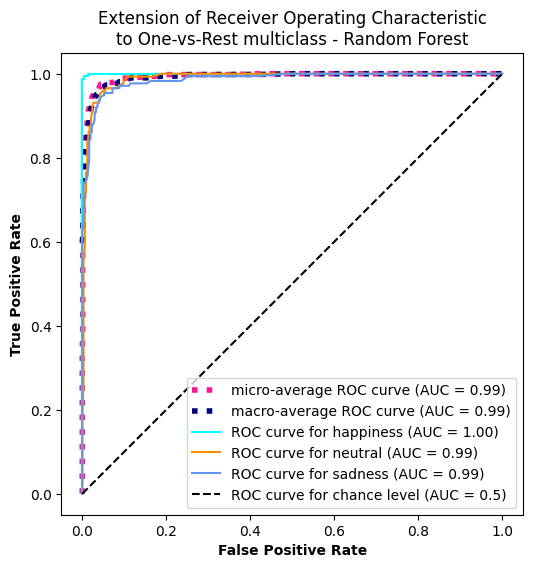

In [78]:
from itertools import cycle
target_names = ["happiness", "neutral", "sadness"]

fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

plt.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(n_classes), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test_rf[:, class_id],
        y_score_rf[:, class_id],
        name=f"ROC curve for {target_names[class_id]}",
        color=color,
        ax=ax,
    )

plt.plot([0, 1], [0, 1], "k--", label="ROC curve for chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate", fontweight='bold')
plt.ylabel("True Positive Rate", fontweight='bold')
plt.title("Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass - Random Forest")
plt.legend()
plt.show()

Predicted: Happiness Neutral Sadness
True: Happiness 1596 1 3
True: Neutral 19 1455 126
True: Sadness 8 70 1522


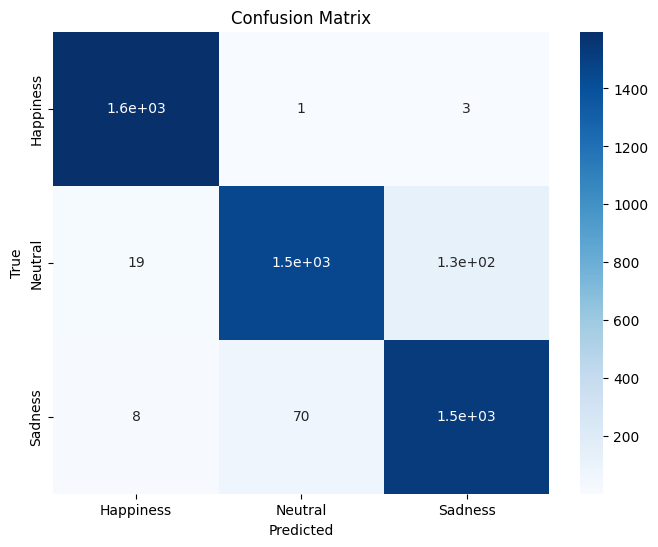

Accuracy: 0.953
Combinations of Best Parameters:
(max_depth, max_features): number of counts


Counter({(None, 'log2'): 3,
         (20, 'sqrt'): 1,
         (None, 'sqrt'): 2,
         (20, 'log2'): 4})

In [79]:
# Calculate the confusion matrix
cm = metrics.confusion_matrix(y_trues, y_preds)

# Define the class labels
class_labels = ['Happiness', 'Neutral', 'Sadness']

# Print the predicted and true labels
print('Predicted:', *class_labels)
for i, row in enumerate(cm):
    print('True:', class_labels[i], *row)

# Calculate the accuracy
accuracy = np.round(metrics.accuracy_score(y_trues, y_preds), 3)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Print the accuracy
print('Accuracy:', accuracy)

# Print the combinations of best parameters
print('Combinations of Best Parameters:')
print('(max_depth, max_features): number of counts')
par1 = [i['max_depth'] for i in best_p]
par2 = [i['max_features'] for i in best_p]
pars = list(zip(par1, par2))
Counter(pars)

Confusion Matrix:
Predicted: Happiness Neutral Sadness
True: Happiness  1596     1     3
True: Neutral    19  1455   126
True: Sadness     8    70  1522


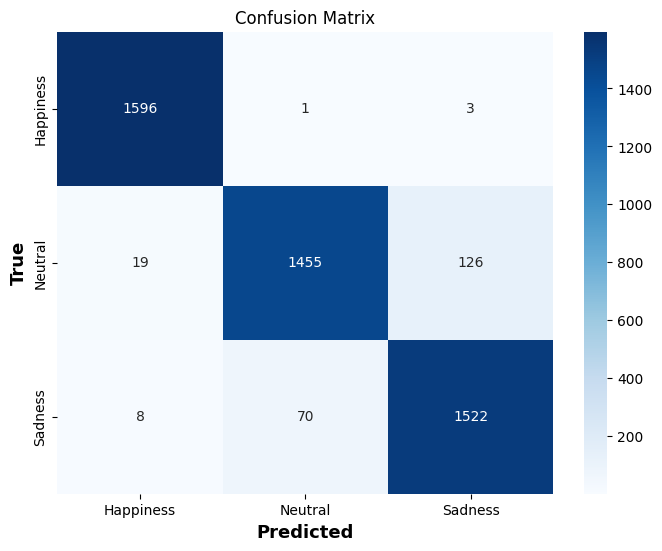

Accuracy: 0.953
Combinations of Best Parameters:
(max_depth, max_features): number of counts
(None, 'log2'): 3
(20, 'sqrt'): 1
(None, 'sqrt'): 2
(20, 'log2'): 4


In [80]:
from collections import Counter

# Calculate the confusion matrix
cm = metrics.confusion_matrix(y_trues, y_preds)

# Define the class labels
class_labels = ['Happiness', 'Neutral', 'Sadness']

# Print the confusion matrix with normal formatting
print('Confusion Matrix:')
print('Predicted:', *class_labels)
for i, row in enumerate(cm):
    print('True:', class_labels[i], *[f"{num:5d}" for num in row])

# Calculate the accuracy
accuracy = np.round(metrics.accuracy_score(y_trues, y_preds), 3)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted', fontweight='bold', fontsize=13)
plt.ylabel('True', fontweight='bold', fontsize=13)
plt.show()

# Print the accuracy
print('Accuracy:', accuracy)

# Print the combinations of best parameters with normal formatting
print('Combinations of Best Parameters:')
print('(max_depth, max_features): number of counts')
par1 = [i['max_depth'] for i in best_p]
par2 = [i['max_features'] for i in best_p]
pars = list(zip(par1, par2))
for par, count in Counter(pars).items():
    print(f"{par}: {count}")


## MLP

In [81]:
start_time = time.time()

hid_layers_s = [(i,) for i in range(3,6)]
val_frac = [0.1, 0.5]
opt_select = ['adam', 'sgd']
activ_f = ['relu', 'logistic']

parameters = {
    'hidden_layer_sizes': hid_layers_s,
    'activation': activ_f,
    'solver': opt_select,
    'validation_fraction': val_frac
}

kfold_outer = KFold(n_splits=10, random_state=10, shuffle=True)
kfold_inner = RepeatedKFold(n_splits=5, n_repeats=3, random_state=50)

mlp_clfr = MLPClassifier(max_iter=10000, early_stopping=True, random_state=20)

y_preds_mlp = []
y_trues_mlp = []
best_p_mlp = []

for train_index, test_index in kfold_outer.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # select the best model
    em_gs = GridSearchCV(mlp_clfr, parameters, cv=kfold_inner, return_train_score=False)
    em_gs.fit(X_train, y_train)
    
    # ROAUC
    y_score_mlp=em_gs.fit(X_train, y_train).predict_proba(X_test)
    label_binarizer_mlp = LabelBinarizer().fit(y_train)
    y_onehot_test_mlp = label_binarizer.transform(y_test)
    
    # use the selected model to predict the classes for the test data
    y_preds_mlp.extend(list(em_gs.predict(X_test)))
    y_trues_mlp.extend(y_test)
    
    # save the best hyperparameter combination
    best_p_mlp.append(em_gs.best_params_)
    
print("--- %s seconds ---" % (time.time() - start_time))

--- 10802.205061674118 seconds ---


In [83]:
y_score_mlp

array([[0.06107131, 0.12392768, 0.81500101],
       [0.06107131, 0.12392768, 0.81500101],
       [0.06107131, 0.12392768, 0.81500101],
       ...,
       [0.98289682, 0.00869452, 0.00840866],
       [0.80991028, 0.07441468, 0.11567504],
       [0.98455463, 0.006935  , 0.00851038]])

In [84]:
label_binarizer_mlp.transform(["happiness"])

array([[1, 0, 0]])

In [85]:
class_of_interest = "happiness"
class_id = np.flatnonzero(label_binarizer_mlp.classes_ == class_of_interest)[0]
class_id

0

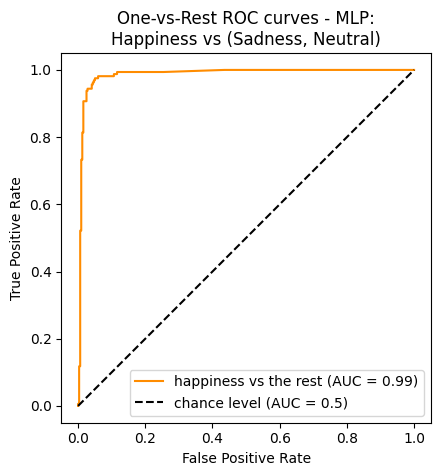

In [86]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_predictions(
    y_onehot_test_mlp[:, class_id],
    y_score_mlp[:, class_id],
    name=f"{class_of_interest} vs the rest",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("One-vs-Rest ROC curves - MLP:\nHappiness vs (Sadness, Neutral)")
plt.legend()
plt.show()

In [87]:
print(f"y_score:\n{y_score_mlp[0:2,:]}")
print()
print(f"y_score.ravel():\n{y_score_mlp[0:2,:].ravel()}")

y_score:
[[0.06107131 0.12392768 0.81500101]
 [0.06107131 0.12392768 0.81500101]]

y_score.ravel():
[0.06107131 0.12392768 0.81500101 0.06107131 0.12392768 0.81500101]


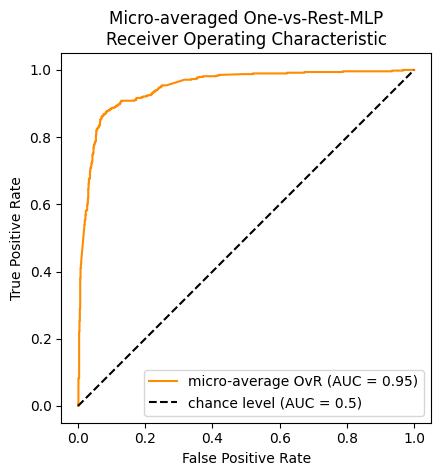

In [88]:
RocCurveDisplay.from_predictions(
    y_onehot_test_mlp.ravel(),
    y_score_mlp.ravel(),
    name="micro-average OvR",
    color="darkorange",
)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest-MLP\nReceiver Operating Characteristic")
plt.legend()
plt.show()

In [89]:
from sklearn.metrics import roc_curve, auc

# store the fpr, tpr, and roc_auc for all averaging strategies
fpr, tpr, roc_auc = dict(), dict(), dict()
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test_mlp.ravel(), y_score_mlp.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
0.95


In [90]:
n_classes = len(np.unique(y))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_onehot_test_mlp[:, i], y_score_mlp[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['macro']:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
0.94


In [91]:
from sklearn.metrics import roc_auc_score
macro_roc_auc_ovr = roc_auc_score(
    y_test,
    y_score_mlp,
    multi_class="ovr",
    average="macro",
)

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{macro_roc_auc_ovr:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
0.94


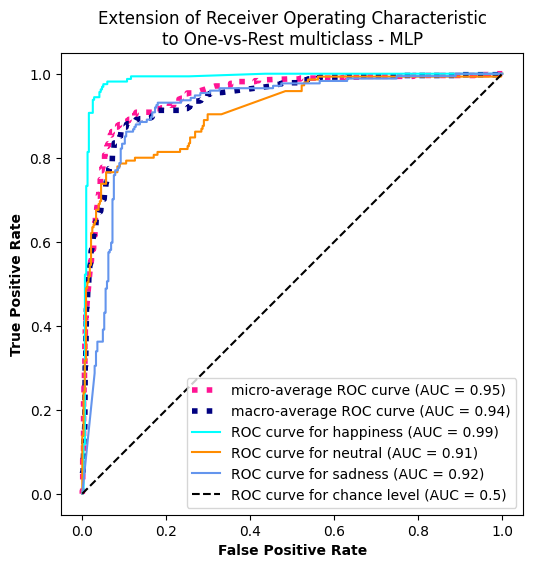

In [93]:
from itertools import cycle
target_names = ["happiness", "neutral", "sadness"]

fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

plt.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(n_classes), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test_mlp[:, class_id],
        y_score_mlp[:, class_id],
        name=f"ROC curve for {target_names[class_id]}",
        color=color,
        ax=ax,
    )

plt.plot([0, 1], [0, 1], "k--", label="ROC curve for chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate", fontweight='bold')
plt.ylabel("True Positive Rate", fontweight='bold')
plt.title("Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass - MLP")
plt.legend()
plt.show()

Predicted: Happiness Neutral Sadness
True: Happiness 1570 9 21
True: Neutral 71 1258 271
True: Sadness 84 224 1292


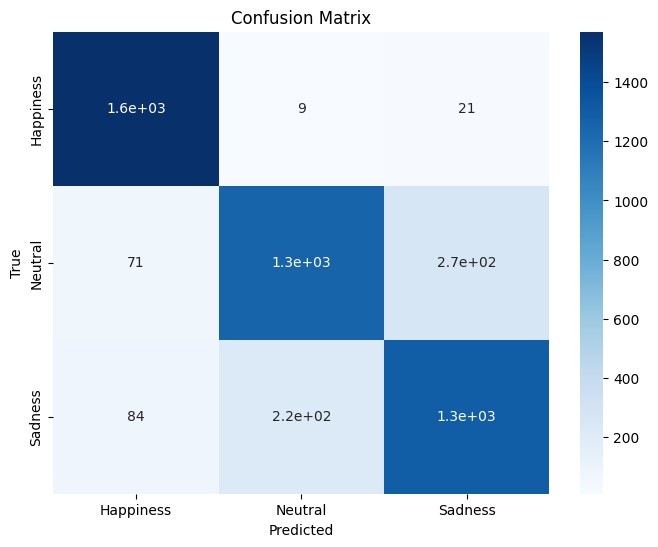

Accuracy: 0.858
Combinations of Best Parameters:
(activation functions, hidden_layer_sizes, solver - optimizer, validation_frac): number of counts


Counter({('relu', (3,), 'adam', 0.5): 7, ('relu', (3,), 'adam', 0.1): 3})

In [94]:
# Calculate the confusion matrix
cm = metrics.confusion_matrix(y_trues_mlp, y_preds_mlp)

# Define the class labels
class_labels = ['Happiness', 'Neutral', 'Sadness']

# Print the predicted and true labels
print('Predicted:', *class_labels)
for i, row in enumerate(cm):
    print('True:', class_labels[i], *row)

# Calculate the accuracy
accuracy = np.round(metrics.accuracy_score(y_trues_mlp, y_preds_mlp), 3)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Print the accuracy
print('Accuracy:', accuracy)

print('Combinations of Best Parameters:')
print('(activation functions, hidden_layer_sizes, solver - optimizer, validation_frac): number of counts')
Counter([tuple(best_p_mlp[i].values()) for i in range(len(best_p_mlp))])

Confusion Matrix:
Predicted: Happiness Neutral Sadness
True: Happiness  1570     9    21
True: Neutral    71  1258   271
True: Sadness    84   224  1292


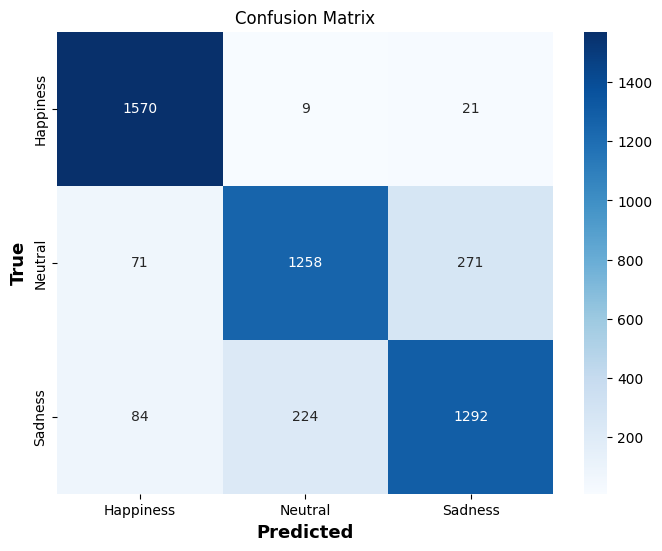

Accuracy: 0.858
Combinations of Best Parameters:
(activation functions, hidden_layer_sizes, solver - optimizer, validation_frac): number of counts
('relu', (3,), 'adam', 0.5): 7
('relu', (3,), 'adam', 0.1): 3


In [95]:
from collections import Counter

# Calculate the confusion matrix
cm = metrics.confusion_matrix(y_trues_mlp, y_preds_mlp)

# Define the class labels
class_labels = ['Happiness', 'Neutral', 'Sadness']

# Print the confusion matrix with normal formatting
print('Confusion Matrix:')
print('Predicted:', *class_labels)
for i, row in enumerate(cm):
    print('True:', class_labels[i], *[f"{num:5d}" for num in row])

# Calculate the accuracy
accuracy = np.round(metrics.accuracy_score(y_trues_mlp, y_preds_mlp), 3)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted', fontsize=13, fontweight='bold')
plt.ylabel('True', fontsize=13, fontweight='bold')
plt.show()

# Print the accuracy
print('Accuracy:', accuracy)

# Print the combinations of best parameters with normal formatting
print('Combinations of Best Parameters:')
print('(activation functions, hidden_layer_sizes, solver - optimizer, validation_frac): number of counts')
best_p_mlp_combinations = [tuple(best_p_mlp[i].values()) for i in range(len(best_p_mlp))]
for par, count in Counter(best_p_mlp_combinations).items():
    print(f"{par}: {count}")